In [120]:
from PIL import Image, ImageChops
import imutils
import numpy as np
import cv2
%pylab inline
plt.rcParams['figure.figsize'] = (10, 10)

Populating the interactive namespace from numpy and matplotlib


In [121]:
value = 209000000000000
# value = 209000000
bundles = value / 10000

length = 156
height = 66
depth = 10

alpha = np.cbrt(bundles * length * height * depth)

In [188]:
upper_limit = 341
l = min(round(alpha / length), upper_limit)
h = min(round(alpha / height), upper_limit)
d = min(round(alpha / depth), upper_limit)

print(l,h,d)

341 341 341


In [189]:
def trim(im):
    im = Image.fromarray(im.astype(np.uint8))        
    print(im.size)
    bg = Image.new(im.mode, im.size, -1)
    diff = ImageChops.difference(im, bg)
    diff = ImageChops.add(diff, diff, 2.0, -100)
#     plt.imshow(diff), plt.show()

    bbox = diff.getbbox()
#     print(bbox)

    if bbox:
        return np.asarray(im.crop(bbox))
# trim(im).show()

(1024, 1024)
(1024, 1024)
(1024, 2048)


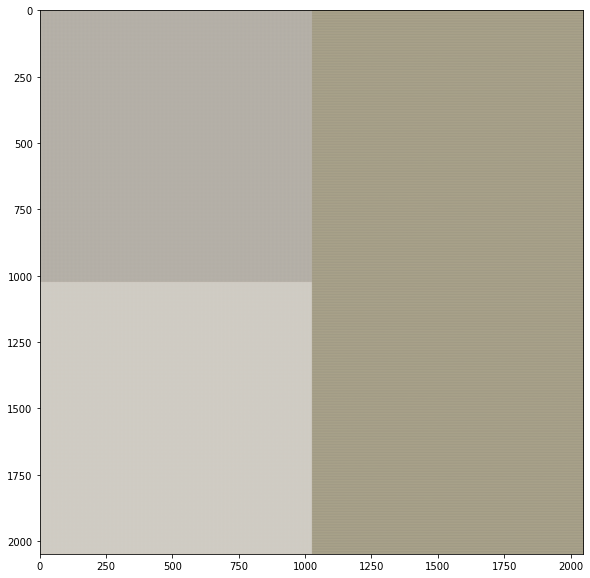

(<matplotlib.image.AxesImage at 0x14fb402b0>, None)

In [190]:
front = np.asarray(Image.open("imgs/front.jpg"))
back = np.asarray(Image.open("imgs/back.jpg"))
side = np.asarray(Image.open("imgs/side.jpg"))

full_dims = (2048,2048) # x,y

front_bills_x = int(1024 / l )
front_bills_y = int(1024 / h)
front_scaled = cv2.resize(front, (front_bills_x, front_bills_y))

front_layer = np.dstack([np.full((1024, 1024), -1) for _ in range(3)])

for i in range(l):
    for j in range(h):
        front_layer[j * front_bills_y: (j+1) * front_bills_y, i*front_bills_x:(i+1)*front_bills_x, :] = front_scaled

front_layer = trim(front_layer)
front_layer = cv2.resize(front_layer, (1024, 1024))        

back_bills_x = max(int(1024 / l),1)
back_bills_y = max(int(1024 / h),1)
back_scaled = cv2.resize(back, (back_bills_x, back_bills_y))

back_layer = np.dstack([np.full((1024, 1024), -1) for _ in range(3)])
        
for i in range(l):
    for j in range(h):
        back_layer[j * back_bills_y: (j+1) * back_bills_y, i*back_bills_x:(i+1)*back_bills_x, :] = back_scaled
# plt.imshow(Image.fromarray(back_layer.astype(np.uint8))), plt.show()
back_layer = trim(back_layer)
back_layer = cv2.resize(back_layer, (1024, 1024))
        
side_bills_x = int(1024 / d)
side_bills_y = int(2048 / h)
side_scaled = cv2.resize(side, (side_bills_x, side_bills_y))

side_layer = np.dstack([np.full((2048, 1024), -1) for _ in range(3)])

for i in range(d):
    for j in range(h):
        side_layer[j * side_bills_y: (j+1) * side_bills_y, i*side_bills_x:(i+1)*side_bills_x, :] = side_scaled     

side_layer = trim(side_layer)
side_layer = cv2.resize(side_layer, (1024, 2048))

texture = np.dstack([np.full((2048, 2048), 255) for _ in range(3)])
texture[0:1024, 0:1024, :] = front_layer
texture[1024:, 0:1024, :] = back_layer
texture[:, 1024:, :] = side_layer

plt.imshow(texture), plt.show()

In [191]:
Image.fromarray(side_layer.astype(np.uint8))
print(side_layer.shape)

(2048, 1024, 3)


In [192]:
Image.fromarray(front_scaled)

In [112]:
type(front_layer[0][0][0])

numpy.uint8

In [43]:
front_scaled[0][0]

array([210, 217, 223], dtype=uint8)

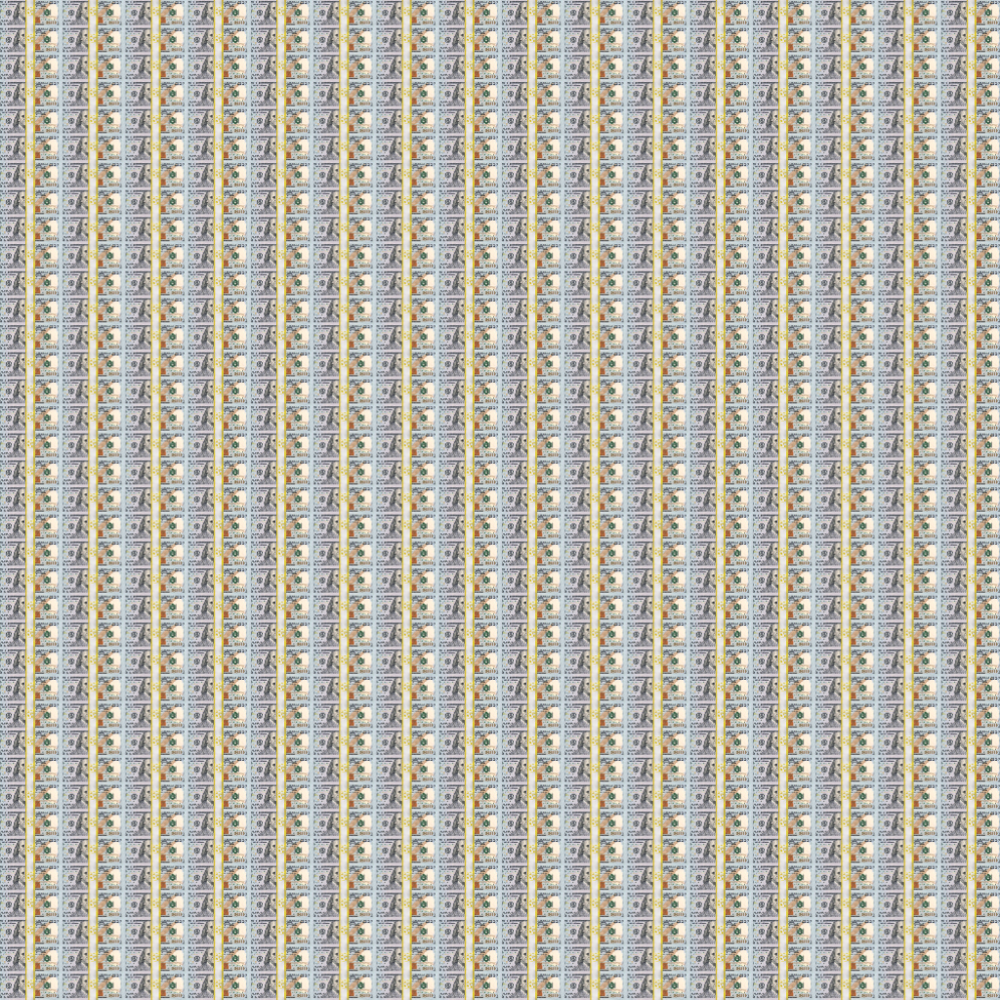

In [44]:
Image.fromarray(front_layer.astype(np.uint8))

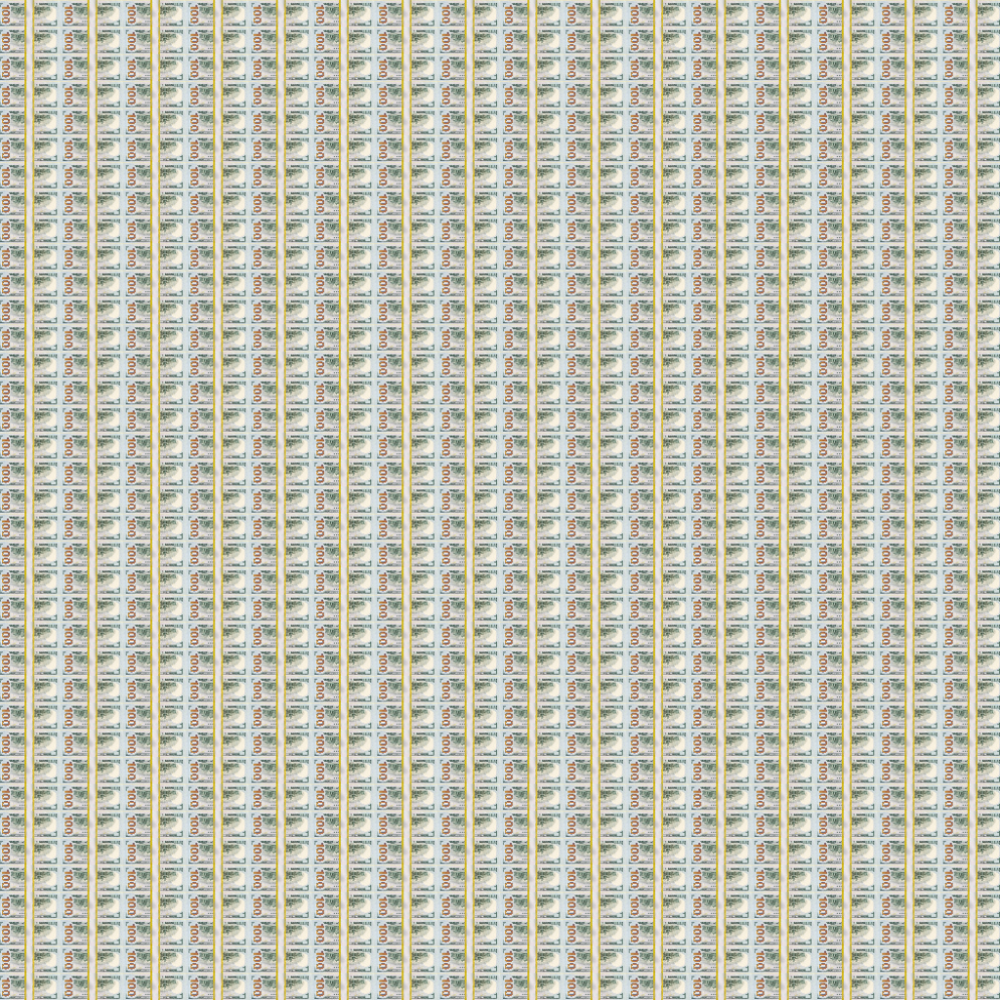

In [45]:
Image.fromarray(back_layer.astype(np.uint8))

In [46]:
texture = np.dstack([np.full((2048, 2048), 255) for _ in range(3)])
texture[0:1024,0:1024,:] = front_layer
texture[1024:,0:1024,:] = back_layer
texture[:, 1024:, :] = side_layer

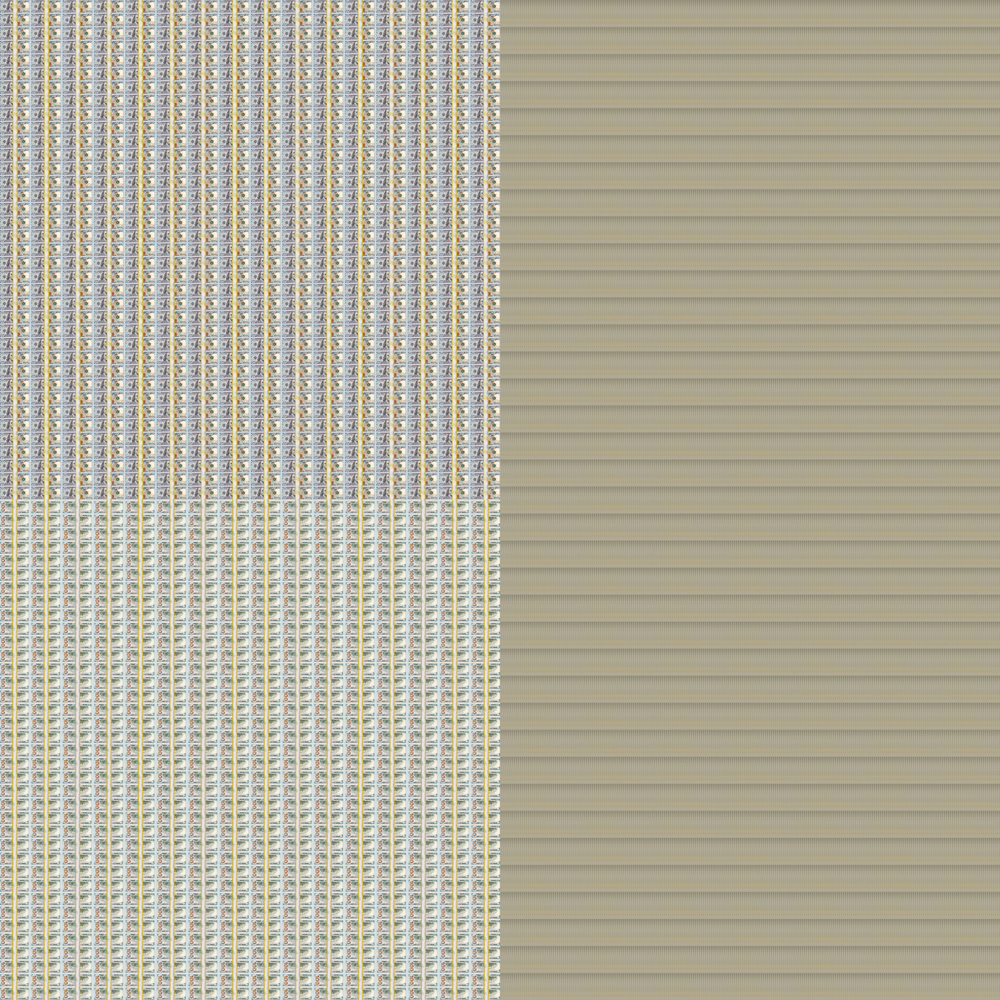

In [47]:
Image.fromarray(texture.astype(np.uint8))

In [48]:
def human_format(num):
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    # add more suffixes if you need them
    output = '%.2f%s' % (num, ['', 'K', 'M', 'B', 'T'][magnitude])
    output = output.replace('.', '_')
    return output
    

In [49]:
human_format(value)

'1_40B'

In [50]:
Image.fromarray(texture.astype(np.uint8)).save(f"imgs/{human_format(value)}.jpg")

In [51]:
print(l,h,d)

16 37 243
